## Reproduce results in Figure 2

Related dataset: 
- [Xenium 2.0 human lung dataset](https://www.10xgenomics.com/cn/datasets/preview-data-ffpe-human-lung-cancer-with-xenium-multimodal-cell-segmentation-1-standard)
    - Reference free mode
- [VisiumHD Mouse brain](https://www.10xgenomics.com/cn/datasets/visium-hd-cytassist-gene-expression-libraries-of-mouse-brain-he)
    - Reference free mode
- [Xenium human lung dataset (Post-Xenium In Situ Applications)](https://www.10xgenomics.com/cn/datasets/xenium-human-lung-cancer-post-xenium-technote)
    - Reference of lung cells can be download [here](https://drive.google.com/file/d/1Lxv8iItLOnD-TLiMsackXS32a6a4NNlk/view?usp=sharing)
    
All the datasets are training with epoch settings: `epochs = 400` `seg_training_epochs = 15` `deconv_warmup_epochs = 200`

All the data for reproducing the result can be downloaded from [Zenodo](temp_link). The data used in this notebook is under the folder `figure_2`.

In [ ]:
import os
# Download the data from the link above to this folder and unzip it, can be changed to your own path
os.chdir("/import/home3/yhchenmath/Dataset/CellARTPaper/figure_2/")

In [5]:
from spatialdata_io import xenium, visium_hd
import geopandas
import numpy as np
import tifffile
import spatialdata as sd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.lines import Line2D
import spatialdata_plot
import scanpy as sc
import geopandas as gpd
from shapely.geometry import Polygon
from shapely.ops import unary_union
import pandas as pd
import seaborn as sns

/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/numba/core/decorators.py:282: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


### Benchmarking on Xenium

In [6]:
sdata = xenium(
    path="/import/home2/yhchenmath/Dataset/DeconvSeg/xenium_human_lung_preview/", # Modify this path to your local data path of Xenium 2.0 human lung dataset, you can refer the docs of SpatialData
    cell_boundaries=True,
    nucleus_boundaries=True,
    morphology_focus=True,
    ) 

INFO     reading /import/home2/yhchenmath/Dataset/DeconvSeg/xenium_human_lung_preview/cell_feature_matrix.h5       


/tmp/ipykernel_3527676/1758527524.py:1: DeprecationWarning: `cell_boundaries` is being deprecated as an argument to `xenium.xenium` in SpatialData version 0.1, switch to `cells_boundaries` instead.
  sdata = xenium(
/tmp/ipykernel_3527676/1758527524.py:1: DeprecationWarning: The default value of `cells_as_circles` will change to `False` in the next release. Please pass `True` explicitly to maintain the current behavior.
  sdata = xenium(


INFO     Transposing `data` of type: <class 'dask.array.core.Array'> to ('c', 'y', 'x').                           


In [ ]:
# ProSeg
from cellart.utils.spatialdata_utils import append_xenium_boundary

df = geopandas.read_file("proseg-cell-polygons.geojson")
df.set_index("cell", inplace=True)

cellart_mask = np.load("./xenium/cellart_segmentation_mask.npy").astype("int32")

cellpose_mask = tifffile.imread("./xenium/nuclei_cellpose.tif").astype("int32")

baysor_mask = tifffile.imread("./xenium/baysor_segmentation_mask.tif").astype("int32")

append_xenium_boundary(cellart_mask, sdata, "cellart_boundaries")
append_xenium_boundary(cellpose_mask, sdata, "cellpose_boundaries")
append_xenium_boundary(baysor_mask, sdata, "baysor_boundaries")

boundaries = sd.models.ShapesModel.parse(df)
sdata.shapes["proseg_boundaries"] = boundaries
seg_transformation = sd.transformations.get_transformation(sdata.shapes["nucleus_boundaries"])
sd.transformations.set_transformation(sdata.shapes["proseg_boundaries"], seg_transformation,
                                        to_coordinate_system="global")

In [10]:
x_min, x_max, y_min, y_max = 20000, 20500, 10000, 10500
sdata_roi = sdata.query.bounding_box(
    min_coordinate=[x_min, y_min], max_coordinate=[x_max, y_max], axes=("x", "y"), target_coordinate_system="global"
)

/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [11]:
def plot_seg(sdata, img_key, shape_key, label, ax, color, lim = None, channel = None, ouline_width=1):
    tmp = sdata.pl.render_images(img_key, channel=channel)
    tmp = tmp.pl.render_shapes(
    # sdata.pl.render_shapes(
            shape_key, 
            color=color,
            fill_alpha=0.,
            outline_color=color,
            outline_alpha=1,
            outline_width=ouline_width,
        ).pl.show(figsize=(8,8), title='', frameon=False, legend_loc='none', ax=ax, return_ax=True, colorbar=False)
    ax.axis('off')
    if lim is not None:
        ax.set_xlim(lim[0], lim[1])
        ax.set_ylim(lim[2], lim[3])
    
    rx0, rx1 = ax.get_xlim()
    ry0, ry1 = ax.get_ylim()
    rect = patches.Rectangle((rx0, ry0), rx1-rx0, ry1-ry0, linewidth=3, linestyle='-', edgecolor='black', facecolor='none')
    ax.add_patch(rect)
    
def plot_he(sdata, ax, lim = None):
    tmp = sdata.pl.render_images("he_image").pl.show(figsize=(8,8), title='', frameon=False, legend_loc='none', ax=ax, return_ax=True, colorbar=False)
    if lim is not None:
        ax.set_xlim(lim[0], lim[1])
        ax.set_ylim(lim[2], lim[3])
    ax.axis('off')
    ax.set_ylim(ax.get_ylim()[::-1])

In [12]:
seg_transformation = sd.transformations.get_transformation(sdata.shapes["nucleus_boundaries"])
translation = sd.transformations.Translation([6, 6.5], axes=("x", "y"))
sequence = sd.transformations.Sequence([translation, seg_transformation])
sd.transformations.set_transformation(sdata_roi.shapes["cellpose_boundaries"], sequence, to_coordinate_system="global")
sd.transformations.set_transformation(sdata_roi.shapes["cellart_boundaries"], sequence, to_coordinate_system="global")
sd.transformations.set_transformation(sdata_roi.shapes["baysor_boundaries"], sequence, to_coordinate_system="global")

sdata_roi.shapes["proseg_boundaries"].geometry = sdata_roi.shapes["proseg_boundaries"].geometry.apply(lambda a: max(a.geoms, key=lambda x: x.area))
sdata_roi.shapes["proseg_boundaries"].geometry = sdata_roi.shapes["proseg_boundaries"].geometry.apply(lambda a: a.buffer(0.5, join_style='round').buffer(-0.5, join_style='round').simplify(0.5))

/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/tifffile/tifffile.py:9306: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/tifffile/tifffile.py:9306: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  warnings.warn(


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/tifffile/tifffile.py:9306: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  warnings.warn(


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/tifffile/tifffile.py:9306: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  warnings.warn(


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/tifffile/tifffile.py:9306: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  warnings.warn(


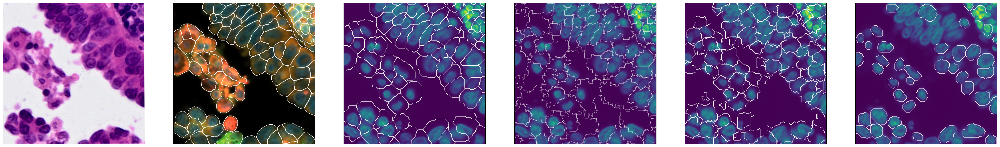

In [13]:
fig, ax = plt.subplots(1, 6, figsize=(48, 8))
plot_he(sdata_roi, ax[0])
plot_seg(sdata_roi, img_key="morphology_focus",
         shape_key = "cell_boundaries", label="Xenium 2.0", ax = ax[1], color='white', lim=[x_min, x_max, y_min, y_max])
plot_seg(sdata_roi, img_key="morphology_focus",
         shape_key = "cellart_boundaries", label="CellART", ax = ax[2], color='white', channel=0, lim=[x_min, x_max, y_min, y_max])
plot_seg(sdata_roi, img_key="morphology_focus",
         shape_key = "proseg_boundaries", label="ProSeg", ax = ax[3], color='white', channel=0, lim=[x_min, x_max, y_min, y_max], ouline_width=0.5)
plot_seg(sdata_roi, img_key="morphology_focus",
         shape_key = "baysor_boundaries", label="Baysor", ax = ax[4], color='white', channel=0, lim=[x_min, x_max, y_min, y_max])
plot_seg(sdata_roi, img_key="morphology_focus",
         shape_key = "cellpose_boundaries", label="Cellpose", ax = ax[5], color='white', channel=0, lim=[x_min, x_max, y_min, y_max])

In [ ]:
# The F1-score and Jaccard Index can be calculated for cell segmentation data using the f1_score.py file located in the same directory as this notebook. 
!python /import/home2/yhchenmath/Code/SVTBenchmarking/segmentation_benchmarking_xenium/f1_score.py --gt_path ./xenium/10X_cell_segmentation_mask.npy --seg_path ./xenium/cellart_segmentation_mask.npy

100%|████████████████████████████████████████████| 1/1 [02:39<00:00, 159.42s/it]
mean F1 Score: 0.8478
mean Jaccard Index: 0.7358


### Benchmarking on VisiumHD

In [14]:
sdata = visium_hd("/home/share/ychenlp/VisiumHD/mouse_brain/") # Modify this path to your local data path of Visium HD mouse brain dataset, you can refer the docs of SpatialData

/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [15]:
cellart_segmentation = np.load("./hd/cellart_segmentation_mask.npy")
spot_id_map = np.load("./hd/spot_id_map.npy")
adata_st_cellart = sc.read_h5ad("./hd/cell_deconv.h5ad")
bin2cell_segmentation = np.load("./hd/bin2cell_segmentation_mask.npy")
stardist_segmentation = np.load("./hd/stardist_segmentation_mask.npy")

In [16]:
from cellart.utils.spatialdata_utils import append_visiumhd_boundary

append_visiumhd_boundary(
    segmentation_mask = cellart_segmentation,
    spot_id_map = spot_id_map,
    sdata = sdata,
    shape_key = "Visium_HD_Mouse_Brain_square_002um",
    new_shape_key = "cellart_seg",
    celltype= adata_st_cellart.obs["celltype"]
)
# sdata hd svt_seg drop nan
sdata.shapes["cellart_seg"] = sdata.shapes["cellart_seg"].dropna()

append_visiumhd_boundary(
    segmentation_mask = bin2cell_segmentation,
    spot_id_map = spot_id_map,
    sdata = sdata,
    shape_key = "Visium_HD_Mouse_Brain_square_002um",
    new_shape_key = "bin2cell_seg",
)

append_visiumhd_boundary(
    segmentation_mask = stardist_segmentation,
    spot_id_map = spot_id_map,
    sdata = sdata,
    shape_key = "Visium_HD_Mouse_Brain_square_002um",
    new_shape_key = "stardist_seg",
)

/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_3527676/2510591147.py:30: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_re.obs["seg"] = segmentation_flat
/tmp/ipykernel_3527676/2510591147.py:34: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sdata.tables[f'square_002um_{new_shape_key}'].obs["seg"] = sdata.tables[f'square_002um_{new_shape_key}'].obs["seg"].astype(
/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

In [17]:
x_min, x_max, y_min, y_max = 6200, 7200, 10250, 11250
sdata_roi = sdata.query.bounding_box(
    min_coordinate=[y_min, x_min], max_coordinate=[y_max, x_max], axes=("y", "x"), target_coordinate_system="global"
)

gdf = gpd.GeoDataFrame(columns=['geometry','seg', 'celltype'])

for cell_id in sdata_roi.shapes["cellart_seg"]["cellart_seg"].unique():
    cell = sdata_roi.shapes["cellart_seg"][sdata_roi.shapes["cellart_seg"]["cellart_seg"] == cell_id]
    cell = cell.geometry.tolist()
    merged = unary_union(cell)
    try:
        outer_boundary = merged.exterior
    except:
        continue
    gdf.loc[len(gdf)] = [Polygon(outer_boundary), cell_id, sdata_roi.shapes["cellart_seg"][sdata_roi.shapes["cellart_seg"]["cellart_seg"] == cell_id].celltype.unique()[0]]
gdf = sd.models.ShapesModel.parse(gdf)
sdata_roi.shapes["cellart_boundary"] = gdf
sdata_roi.shapes["cellart_boundary"]["seg"] = sdata_roi.shapes["cellart_boundary"]["seg"].astype("category")

gdf = gpd.GeoDataFrame(columns=['geometry','seg'])

for cell_id in sdata_roi.shapes["bin2cell_seg"]["bin2cell_seg"].unique():
    cell = sdata_roi.shapes["bin2cell_seg"][sdata_roi.shapes["bin2cell_seg"]["bin2cell_seg"] == cell_id]
    cell = cell.geometry.tolist()
    merged = unary_union(cell)
    try:
        outer_boundary = merged.exterior
    except:
        continue
    gdf.loc[len(gdf)] = [Polygon(outer_boundary), cell_id]
gdf = sd.models.ShapesModel.parse(gdf)
sdata_roi.shapes["bin2cell_boundary"] = gdf
sdata_roi.shapes["bin2cell_boundary"]["seg"] = sdata_roi.shapes["bin2cell_boundary"]["seg"].astype("category")

gdf = gpd.GeoDataFrame(columns=['geometry','seg'])

for cell_id in sdata_roi.shapes["stardist_seg"]["stardist_seg"].unique():
    cell = sdata_roi.shapes["stardist_seg"][sdata_roi.shapes["stardist_seg"]["stardist_seg"] == cell_id]
    cell = cell.geometry.tolist()
    merged = unary_union(cell)
    try:
        outer_boundary = merged.exterior
    except:
        continue
    gdf.loc[len(gdf)] = [Polygon(outer_boundary), cell_id]
gdf = sd.models.ShapesModel.parse(gdf)
sdata_roi.shapes["stardist_boundary"] = gdf
sdata_roi.shapes["stardist_boundary"]["seg"] = sdata_roi.shapes["stardist_boundary"]["seg"].astype("category")

/home/yhchenmath/anaconda3/envs/cellseg/lib/python3.9/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [18]:
def plot_seg(sdata, shape_key, ax, label, lim):
    tmp = sdata.pl.render_images("Visium_HD_Mouse_Brain_full_image")
    tmp = tmp.pl.render_shapes(
        shape_key,
        color="w", fill_alpha=0.1, outline_width=1.5, outline_alpha=1, outline_color = "w"
    ).pl.show(coordinate_systems="global", figsize=(8,8), title='', frameon=False, legend_loc='none', ax=ax, return_ax=True, colorbar=False)
    ax.axis('off')
    if lim is not None:
        ax.set_xlim(lim[0], lim[1])
        ax.set_ylim(lim[2], lim[3])
    # Revert y axis
    ax.invert_yaxis()

def plot_he(sdata, ax):
    sdata.pl.render_images(
    "Visium_HD_Mouse_Brain_full_image").pl.show(coordinate_systems="global", figsize=(8,8), title='', frameon=False, legend_loc='none', ax=ax, return_ax=True, colorbar=False)
    ax.axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


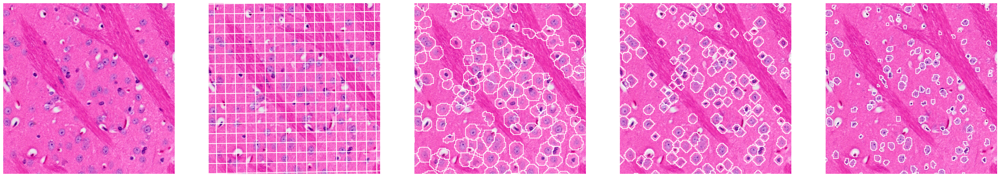

In [19]:
fig, ax = plt.subplots(1, 5, figsize=(40,16))
plot_he(sdata_roi, ax[0])
sdata_roi.pl.render_images(
     "Visium_HD_Mouse_Brain_full_image").pl.render_shapes(
        f"Visium_HD_Mouse_Brain_square_016um", fill_alpha= 0, outline_width=1.5, outline_color = "w", outline_alpha=1
    ).pl.show(coordinate_systems="global", ax=ax[1], title="", frameon=False, legend_loc='none')
ax[1].axis('off')
lim=[x_min, x_max, y_max, y_min]
ax[1].set_xlim(lim[0], lim[1])
ax[1].set_ylim(lim[2], lim[3])
# plot_umi(sdata_roi, ax[1], lim=[x_min, x_max, y_min, y_max])
plot_seg(sdata_roi, "cellart_boundary", ax[2], "CellART", lim=[x_min, x_max, y_min, y_max])
plot_seg(sdata_roi, "bin2cell_boundary", ax[3], "Bin2Cell", lim=[x_min, x_max, y_min, y_max])
plot_seg(sdata_roi, "stardist_boundary", ax[4], "StarDist", lim=[x_min, x_max, y_min, y_max])

In [20]:
method_colors = {
    "CellART": '#B07AA1',
    "Bin2Cell": "#EF42A4",
    "StarDist": '#00BFC4'
}

df = sdata.tables["square_002um"].obs.copy()
df["raw_index"] = df.index
df.set_index("location_id", inplace=True)
df["cellart_seg"] = 0
df["cellart_seg"][sdata.shapes["cellart_seg"].index] = sdata.shapes["cellart_seg"]["cellart_seg"]
df["bin2cell_seg"] = 0
df["bin2cell_seg"][sdata.shapes["bin2cell_seg"].index] = sdata.shapes["bin2cell_seg"]["bin2cell_seg"]
df["stardist_seg"] = 0
df["stardist_seg"][sdata.shapes["stardist_seg"].index] = sdata.shapes["stardist_seg"]["stardist_seg"]
df["location_id"] = df.index
df.set_index("raw_index", inplace=True)
sdata.tables["square_002um"].obs = df

/tmp/ipykernel_3527676/54112280.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df["cellart_seg"][sdata.shapes["cellart_seg"].index] = sdata.shapes["cellart_seg"]["cellart_seg"]
/tmp/ipykernel_3527676/54112280.py:11: SettingWithCopyWarn

In [21]:
umi_total = sdata.tables["square_002um"].X.sum()
umi_cellart = sdata.tables["square_002um"].X[sdata.tables["square_002um"].obs["cellart_seg"] != 0].sum()
umi_bin2cell = sdata.tables["square_002um"].X[sdata.tables["square_002um"].obs["bin2cell_seg"] != 0].sum()
umi_stardist = sdata.tables["square_002um"].X[sdata.tables["square_002um"].obs["stardist_seg"] != 0].sum()

In [22]:
df = pd.DataFrame({
    "Methods": ["CellART", "Bin2Cell", "StarDist"],
    "Value": [umi_cellart/umi_total, umi_bin2cell/umi_total, umi_stardist/umi_total]
})

In [23]:
def plot_bar(df, x_col, y_col, hue, y_label, ax, method_colors, error_bar=False):
    # Plot
    if error_bar:
        sns.barplot(
            data=df,
            x=x_col,
            y=y_col,
            hue=hue,
            estimator=np.median,
            errorbar=('pi', 10),
            capsize=0.1,
            palette=method_colors,
            ax=ax,
            err_kws={"linewidth": 1}
        )
    else:
        sns.barplot(
            data=df,
            x=x_col,
            y=y_col,
            hue=hue,
            capsize=0.1,
            palette=method_colors,
            ax=ax,
            err_kws={"linewidth": 1}
        )

    # Axis labels and limits
    ax.set_ylabel(y_label, fontsize=15)
    ax.set_xlabel('')
    # ax.set(ylim=(0.18, 0.22))

    # Rotate x-tick labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    # Remove grid
    ax.grid(False)

    # Customize spines (axis lines)
    ax.spines['left'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_linewidth(1)
    ax.spines['bottom'].set_linewidth(1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Add small outward ticks
    ax.tick_params(
        axis='both',
        which='major',
        direction='out',
        length=4,
        width=1,
        color='black',
        bottom=True, top=False, left=True, right=False
    )

/tmp/ipykernel_3527676/1299399706.py:34: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


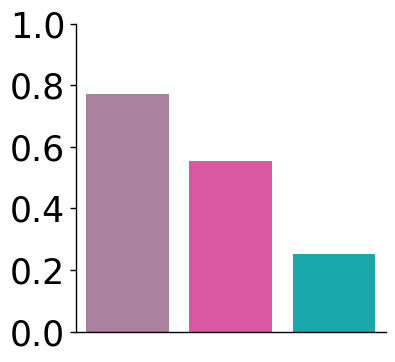

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
plot_bar(df, x_col="Methods", y_col='Value', hue="Methods", y_label='', ax=ax, method_colors=method_colors, error_bar=False)
# No x,y labels
ax.set_xlabel('')
ax.set_ylabel('')
# No x tick
ax.set_xticks([])
# y ticks: 0, 0.2, 0.4, 0.6, 0.8
ax.set_yticks(np.arange(0, 1.1, 0.2))
ax.tick_params(axis='y', labelsize=25)

In [35]:
df_nucl_corr = pd.read_csv("./hd/nucleus_corr.csv", index_col=0)
df_overlapping_corr = pd.read_csv("./hd/overlapping_corr.csv", index_col=0)

In [36]:
df_nucl_corr["correlation_type"] = "Nucleus"
df_overlapping_corr["correlation_type"] = "Overlapping"

# Rename
df_nucl_corr.rename(columns={"Nucleus Correlation": "Correlation"}, inplace=True)
df_overlapping_corr.rename(columns={"Overlapping Correlation": "Correlation"}, inplace=True)

# concatenate the two dataframes at row axis
df = pd.concat([df_nucl_corr, df_overlapping_corr], axis=0)

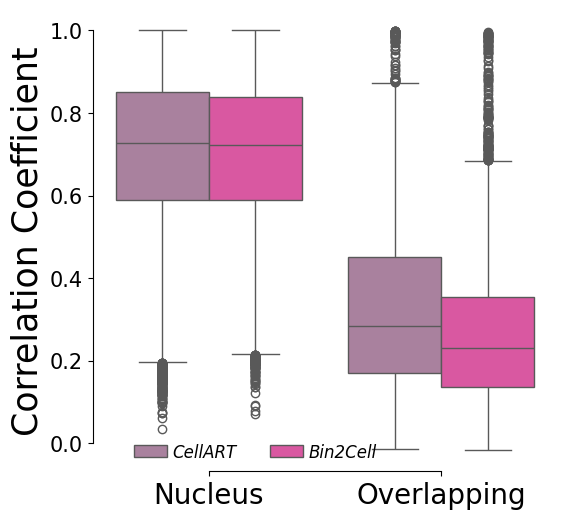

In [37]:
fig, ax= plt.subplots(1,1,figsize=(6,6))
sns.boxplot(x="correlation_type", y="Correlation",hue="method", palette=[method_colors["CellART"], method_colors["Bin2Cell"]], hue_order=["CellART", "Bin2Cell"], data=df, ax=ax)
sns.despine(trim=True)
# Set x,y label size
ax.set_xlabel("")
ax.set_ylabel("Correlation Coefficient", fontsize=25)
# Set x,y ticks size
ax.tick_params(axis='x', labelsize=20)
# Rotate x ticks
ax.tick_params(axis='y', labelsize=15)

# Legend: no method in title
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(0.35,-0.01), loc='lower center', ncol=2, handletextpad=0.3, prop={'size': 12, 'style': 'italic'}, frameon=False)

### Annotation benchmarking

In [38]:
import scanpy as sc

result_dict_raw = {
    "xenium-svt": sc.read("./annotation/cell_deconv_xenium.h5ad"),
    "xenium-scvi": sc.read("./annotation/xenium_scvi.h5ad"),
    "xenium-tangram": sc.read("./annotation/xenium_tangram.h5ad"),
    "xenium-rctd": sc.read("./annotation/rctd_xenium.h5ad"),
    "visiumhd-svt": sc.read("./annotation/cell_deconv_visiumHD.h5ad"),
    "visiumhd-scvi": sc.read("./annotation/visiumhd_scvi.h5ad"),
    "visiumhd-tangram": sc.read("./annotation/visiumhd_tangram.h5ad"),
    "visiumhd-rctd": sc.read("./annotation/rctd_visiumhd.h5ad"),
}

In [39]:
for k in result_dict_raw.keys():
    adata = result_dict_raw[k]
    if k.endswith("scvi"):
        adata.obs["x"] = adata.obsm["spatial"][:, 0]
        adata.obs["y"] = adata.obsm["spatial"][:, 1]
        adata.obs["celltype"] = adata.obs["C_scANVI"]

for k in result_dict_raw.keys():
    adata = result_dict_raw[k]
    if k.endswith("tangram"):
        adata.obs["celltype"] = adata.obsm["tangram_ct_pred"].idxmax(axis=1)
  
# Rotate xenium
for k in result_dict_raw.keys():
    adata = result_dict_raw[k]
    if k.startswith("xenium"):
        temp = adata.obs["x"].copy()
        adata.obs["x"] = adata.obs["y"]
        adata.obs["y"] = temp

In [40]:
# Common cells in Nuclei
adata_xenium = result_dict_raw["xenium-svt"].copy()
adata_visiumhd = result_dict_raw["visiumhd-svt"].copy()

# Filtered < 5 for xenium, < 2 for visiumHD
sc.pp.filter_cells(adata_xenium, min_counts=5)
sc.pp.filter_cells(adata_visiumhd, min_counts=2)

common_cells = adata_xenium.obs_names.intersection(adata_visiumhd.obs_names)

df_0 = result_dict_raw["xenium-svt"][common_cells].obs["celltype"]
consensus_cells = common_cells
for k in result_dict_raw.keys():
    if k == "xenium-svt":
        continue
    if k.startswith("xenium"):
        # Select those id same with xenium-svt
        consensus_id = result_dict_raw[k][consensus_cells].obs["celltype"] == df_0
        consensus_cells = consensus_cells[consensus_id]
        df_0 = df_0.loc[consensus_cells]

ambiguous_cells = common_cells.difference(consensus_cells)


adata_xenium = result_dict_raw["xenium-svt"][consensus_cells].copy()
adata_visiumhd = result_dict_raw["visiumhd-svt"][consensus_cells].copy()

# Filter cell with small UMI
# Due to less UMI in visiumHD
# sc.pp.filter_cells(adata_xenium, min_counts=5)
# sc.pp.filter_cells(adata_visiumhd, min_counts=2)

consensus_cells_large_umi = adata_xenium.obs_names.intersection(adata_visiumhd.obs_names)
# Small: common_cells - common_cells_large_umi
consensus_cells_small_umi = consensus_cells.difference(consensus_cells_large_umi)

In [41]:
df = pd.DataFrame({
    "rctd": result_dict_raw["xenium-rctd"][common_cells].obs["celltype"],
    "svt": result_dict_raw["xenium-svt"][common_cells].obs["celltype"],
    "scvi": result_dict_raw["xenium-scvi"][common_cells].obs["celltype"],
    "tangram": result_dict_raw["xenium-tangram"][common_cells].obs["celltype"],
})

# Step 2: Define a function to find consensus if 3 or more agree
def get_consensus(row):
    value_counts = row.value_counts()
    if value_counts.iloc[0] >= 3:
        return value_counts.index[0]  # consensus
    else:
        return None  # no consensus

# Step 3: Apply to each row
df["consensus"] = df.apply(get_consensus, axis=1)

# Step 4: Select only rows with consensus
consensus_cells = df[df["consensus"].notnull()].index

In [42]:
result_dict_common = {}
result_dict_consensus = {}
result_dict_ambiguous = {}
result_dict_consensus_large_umi = {}
result_dict_consensus_small_umi = {}


for k in result_dict_raw.keys():
    result_dict_common[k] = result_dict_raw[k][common_cells]
    result_dict_consensus_large_umi[k] = result_dict_raw[k][consensus_cells_large_umi]
    result_dict_consensus_small_umi[k] = result_dict_raw[k][consensus_cells_small_umi]
    result_dict_consensus[k] = result_dict_raw[k][consensus_cells]
    result_dict_ambiguous[k] = result_dict_raw[k][ambiguous_cells]

In [43]:
# Compute the accuracy: Common, Large UMI, Small UMI, Consensus
import numpy as np
methods = ["svt", "scvi", "tangram", "rctd"]

df_result = pd.DataFrame(index=methods, columns=["Common", "Consensus", "Ambiguous"])

for m in methods:
    adata_h = result_dict_common[f"visiumhd-{m}"]
    adata_x = result_dict_common[f"xenium-{m}"]
    ct_hd = adata_h.obs["celltype"]
    ct_xenium = adata_x.obs["celltype"]
    acc = np.sum(ct_hd == ct_xenium) / len(ct_hd)
    # print(f"Common: {m}: {acc}")
    df_result.loc[m, "Common"] = acc

for m in methods:
    adata_h = result_dict_consensus[f"visiumhd-{m}"]
    adata_x = result_dict_consensus[f"xenium-{m}"]
    ct_hd = adata_h.obs["celltype"]
    ct_xenium = adata_x.obs["celltype"]
    acc = np.sum(ct_hd == ct_xenium) / len(ct_hd)
    # print(f"Consensus: {m}: {acc}")
    df_result.loc[m, "Consensus"] = acc

for m in methods:
    adata_h = result_dict_ambiguous[f"visiumhd-{m}"]
    adata_x = result_dict_ambiguous[f"xenium-{m}"]
    ct_hd = adata_h.obs["celltype"]
    ct_xenium = adata_x.obs["celltype"]
    acc = np.sum(ct_hd == ct_xenium) / len(ct_hd)
    # print(f"Ambiguous: {m}: {acc}")
    df_result.loc[m, "Ambiguous"] = acc

for m in methods:
    adata_h = result_dict_consensus_large_umi[f"visiumhd-{m}"]
    adata_x = result_dict_consensus_large_umi[f"xenium-{m}"]
    ct_hd = adata_h.obs["celltype"]
    ct_xenium = adata_x.obs["celltype"]
    acc = np.sum(ct_hd == ct_xenium) / len(ct_hd)

for m in methods:
    adata_h = result_dict_consensus_small_umi[f"visiumhd-{m}"]
    adata_x = result_dict_consensus_small_umi[f"xenium-{m}"]
    ct_hd = adata_h.obs["celltype"]
    ct_xenium = adata_x.obs["celltype"]
    acc = np.sum(ct_hd == ct_xenium) / len(ct_hd)

# Entropy of ambiguous visium-m
import scipy.stats as stats


def entropy(x):
    p = x.value_counts(normalize=True)
    return stats.entropy(p)


for m in methods:
    adata_h = result_dict_common[f"visiumhd-{m}"]
    # adata_h = result_dict_ambiguous[f"visiumhd-{m}"]
    entropy_value = entropy(adata_h.obs["celltype"])
    df_result.loc[m, "Entropy"] = entropy_value

/tmp/ipykernel_3527676/2742435302.py:46: RuntimeWarning: invalid value encountered in long_scalars
  acc = np.sum(ct_hd == ct_xenium) / len(ct_hd)


In [44]:
df_result

,Common,Consensus,Ambiguous,Entropy
svt,0.543997,0.562052,0.529937,1.515165
scvi,0.512789,0.541675,0.443142,1.585485
tangram,0.43308,0.418427,0.518115,1.256049
rctd,0.518427,0.541349,0.487337,1.678979


In [45]:
celltype_mapping = {
    'Epithelium': '#1B9E77',          # Teal
    'Lymphoid': '#7570B3',            # Blue
    'Fibroblast lineage': '#D95F02',  # Orange-Brown
    'Blood vessels': '#E6AB02',       # Yellow-Gold
    'Myeloid': '#E7298A',             # Red-Pink
    'Lymphatic EC': '#66A61E',        # Green
    'Smooth muscle': '#666666',       # Dark Gray
}

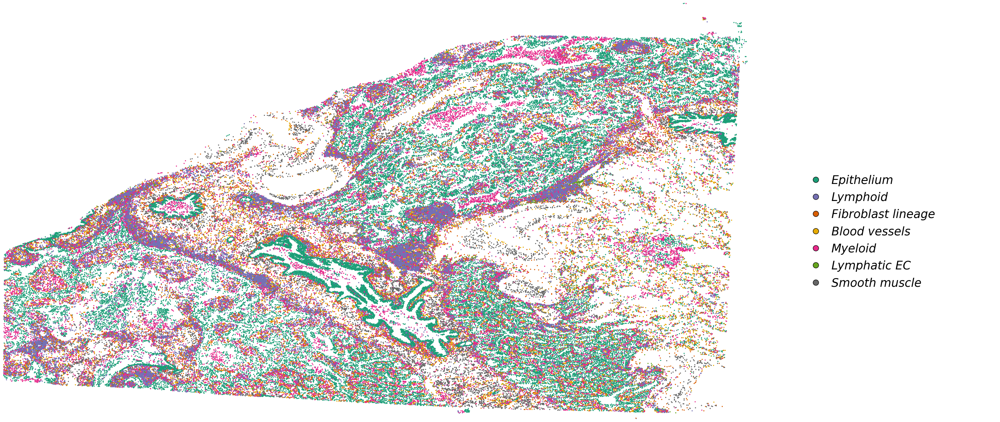

In [46]:
from matplotlib.gridspec import GridSpec

df_plot = result_dict_common['xenium-svt'].obs

fig, ax = plt.subplots(1, 4, figsize=(30, 15))
gs = GridSpec(1, 4, figure=fig)

for ax_ in ax.flatten():
    fig.delaxes(ax_)

ax1 = fig.add_subplot(gs[0, :3])
ax2 = fig.add_subplot(gs[0, 3])

celltype_names = list(celltype_mapping.keys())
# selected_celltype = ["Tumor II", "Tumor III", "Tumor V"]
selected_celltype = celltype_names
for i in range(len(celltype_names)):
    # (0,0) is on the top left corner
    sub_df = df_plot[df_plot["celltype"] == celltype_names[i]]
    ax1.scatter(sub_df["x"], sub_df["y"], s=2, label=celltype_names[i], color=celltype_mapping[celltype_names[i]])
# ax1.invert_yaxis()
ax1.axis("off")
ax1.set_xlim(df_plot["x"].min(), df_plot["x"].max())
ax1.set_ylim(df_plot["y"].min(), df_plot["y"].max())
ax1.invert_yaxis()

# Add legend elements (example)
legend_elements = [
    Line2D(
        [0], [0],
        marker='o',
        linestyle='None',
        color='w',
        label=label,
        markerfacecolor=color,
        markeredgecolor='k',
        markersize=12
    ) for label, color in celltype_mapping.items()
]

# Add the legend below the entire figure, centered horizontally with [0, 1] subfigures
ax2.legend(
    handles=legend_elements,
    loc='center',                    # Center the legend within the bounding box
    bbox_to_anchor=(0.48, 0.45),       # Center of ax2 (0.5, 0.5 is the middle of the axis)
    ncol=1,                          # Number of columns for the legend
    handletextpad=0.35,               # Spacing between marker and text
    columnspacing=1,               # Spacing between legend columns
    prop={'size': 25, 'style': 'italic'},  # Font size and style
    frameon=False                    # No border for the legend
)

ax2.axis("off")  # Hide the axis for ax2
# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.15, 1, 1])  # Leave space for the legend below the plots
plt.show()

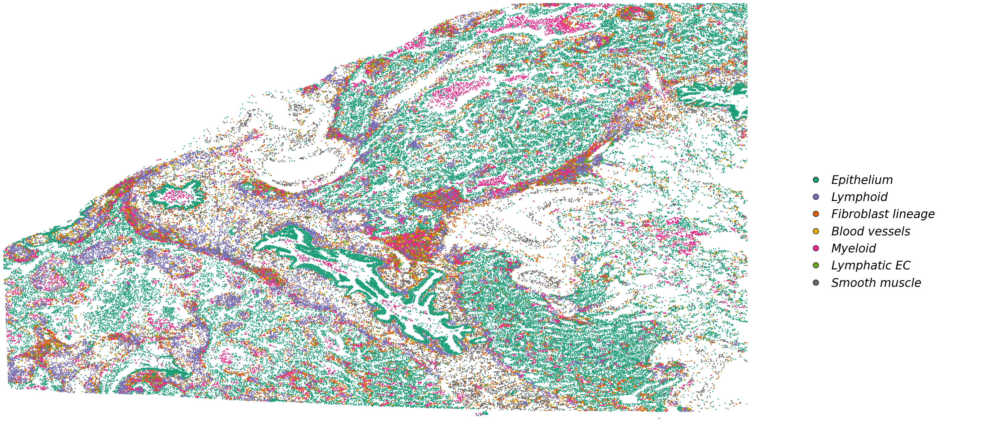

In [48]:
df_plot = result_dict_common['visiumhd-svt'].obs

fig, ax = plt.subplots(1, 4, figsize=(30, 15))
gs = GridSpec(1, 4, figure=fig)

for ax_ in ax.flatten():
    fig.delaxes(ax_)

ax1 = fig.add_subplot(gs[0, :3])
ax2 = fig.add_subplot(gs[0, 3])

celltype_names = list(celltype_mapping.keys())
# selected_celltype = ["Tumor II", "Tumor III", "Tumor V"]
selected_celltype = celltype_names
for i in range(len(celltype_names)):
    # (0,0) is on the top left corner
    sub_df = df_plot[df_plot["celltype"] == celltype_names[i]]
    ax1.scatter(sub_df["x"], sub_df["y"], s=2, label=celltype_names[i], color=celltype_mapping[celltype_names[i]])
# ax1.invert_yaxis()
ax1.axis("off")
ax1.set_xlim(df_plot["x"].min(), df_plot["x"].max())
ax1.set_ylim(df_plot["y"].min(), df_plot["y"].max())
ax1.invert_yaxis()

# Add legend elements (example)
legend_elements = [
    Line2D(
        [0], [0],
        marker='o',
        linestyle='None',
        color='w',
        label=label,
        markerfacecolor=color,
        markeredgecolor='k',
        markersize=12
    ) for label, color in celltype_mapping.items()
]

# Add the legend below the entire figure, centered horizontally with [0, 1] subfigures
ax2.legend(
    handles=legend_elements,
    loc='center',                    # Center the legend within the bounding box
    bbox_to_anchor=(0.48, 0.45),       # Center of ax2 (0.5, 0.5 is the middle of the axis)
    ncol=1,                          # Number of columns for the legend
    handletextpad=0.35,               # Spacing between marker and text
    columnspacing=1,               # Spacing between legend columns
    prop={'size': 25, 'style': 'italic'},  # Font size and style
    frameon=False                    # No border for the legend
)

ax2.axis("off")  # Hide the axis for ax2
# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.15, 1, 1])  # Leave space for the legend below the plots
plt.show()


### Computational benchmarking

Computational benchmarking results can be checked with [wandb](https://wandb.ai/) reports for the training and testing process, as well as the resources [here](https://wandb.ai/chenyh368/ComputationalResources/reports/CellART-computational-resources--VmlldzoxNTA4MDExNA?accessToken=lfb6g0he0ahmrsgswde6fsn8tz066qgoure9c0kud35qta9see90o8jf6o7z7zlr).